In [1]:
%load_ext autoreload
%autoreload 2

import os, sys
import argparse, cv2, logging, pdb
import focus_stacking.registration.ecc as ecc
import focus_stacking.utils.images as im_utils
import focus_stacking.utils.data_loader as data_loader
from focus_stacking.utils.pyramids import StackPyramid, Pyramid
import focus_stacking.utils.pyramids
import focus_stacking.energy.energy as energies
import focus_stacking.fusion.fusion as fusion
import focus_stacking.pipelines.scale_transform_pipeline as scale_transform
import focus_stacking.pipelines.simple_pipeline as simple_pipeline
import numpy as np, matplotlib.pyplot as plt
import focus_stacking.eval.fused_performance as fusion_metrics

align_max_iters = 50
align_eps = 1e-3
DATA_ROOT = '/n/fs/3d-indoor/macro_data/focus_stacks'

logger = logging.getLogger(__name__)


In [2]:
aux_out_dir = '/n/fs/3d-indoor/tmp_outdir/aux/'
registered_images = data_loader.load_images_from_dir(aux_out_dir, match='reg_*.jpg')

In [3]:
fused_im = cv2.imread('lap_pyr.png')

NameError: name 'score' is not defined

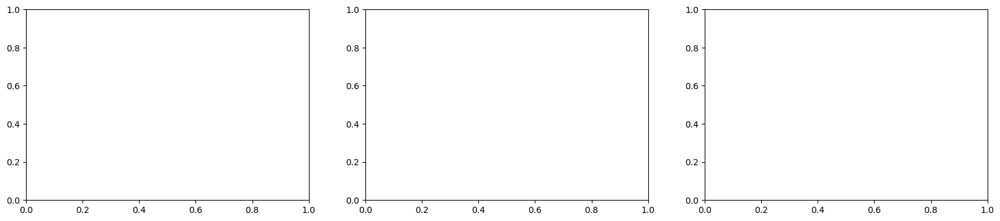

In [4]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,4))
plt.title(f'score: {score:.4f}')
ax1.imshow(im_utils.bgr_to_rgb(fused_im))
ax2.imshow(im_utils.bgr_to_rgb(src_im))
ax3.imshow(gradient_preservation)
plt.subplots_adjust(wspace=0, hspace=0)

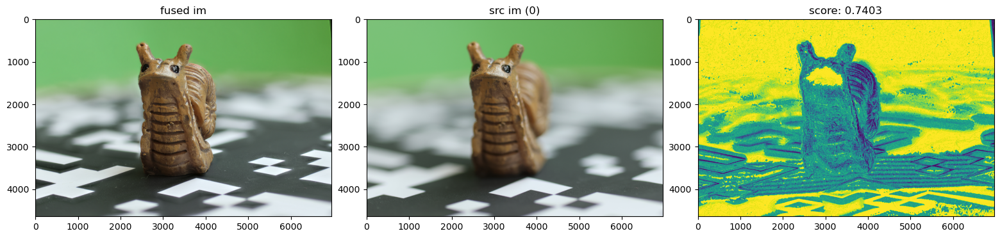

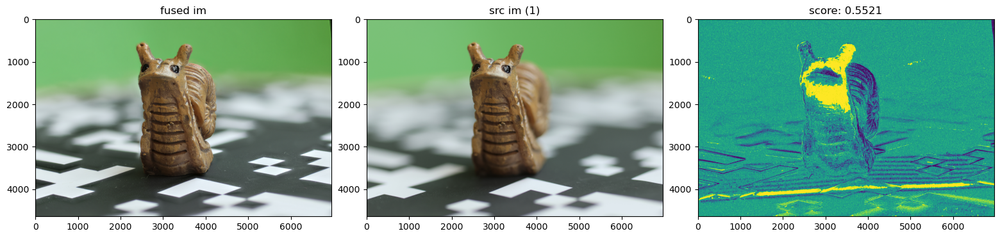

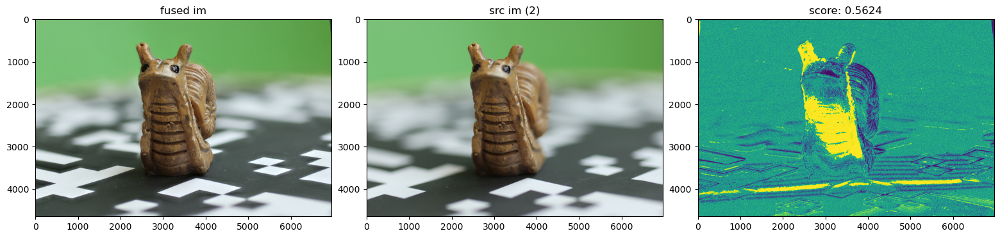

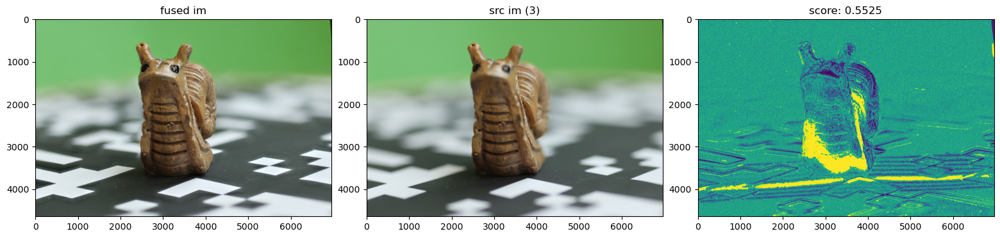

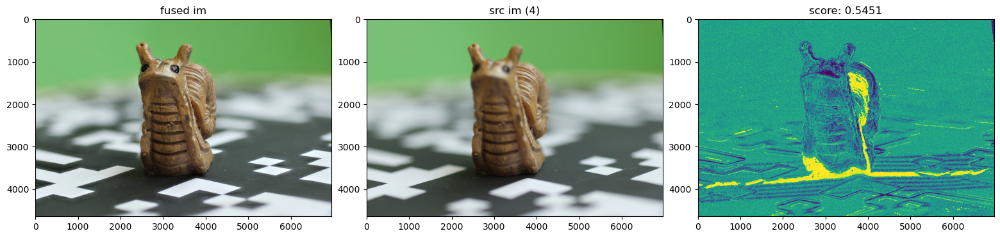

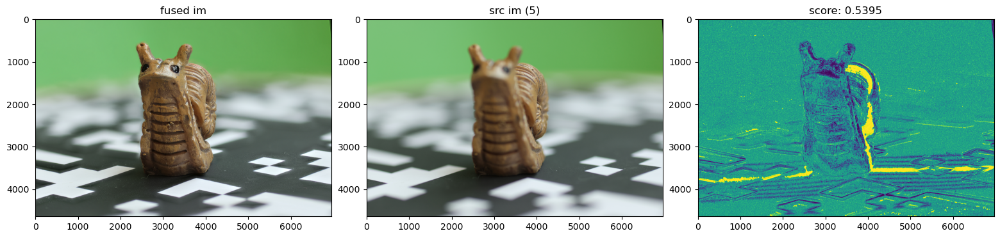

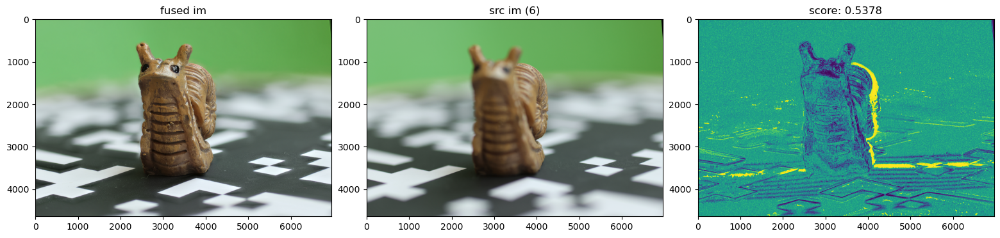

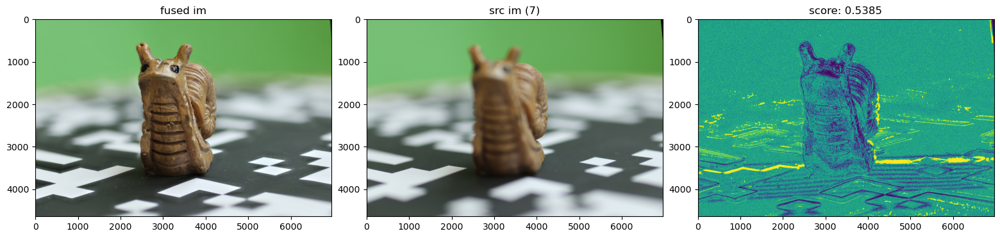

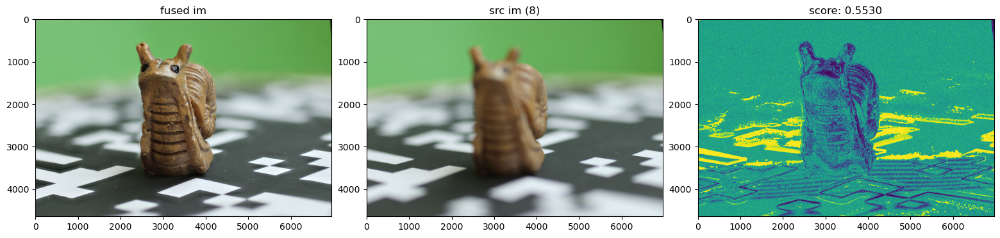

In [5]:
grad_preservation_stack = []
for idx, src_im in enumerate(registered_images):
    rel_grad_mag, gradient_preservation, score = fusion_metrics.gradient_preservation(fused_im, src_im, ksize=5)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,4))
    ax1.title.set_text('fused im')
    ax1.imshow(im_utils.bgr_to_rgb(fused_im))
    ax2.title.set_text(f'src im ({idx})')
    ax2.imshow(im_utils.bgr_to_rgb(src_im))
    ax3.title.set_text(f'score: {score:.4f}')
    ax3.imshow(gradient_preservation)
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()
    grad_preservation_stack.append(gradient_preservation)

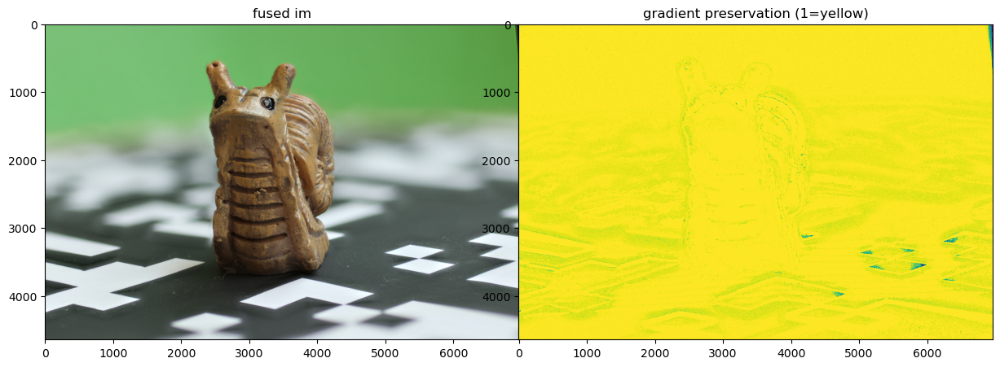

In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
ax1.title.set_text('fused im')
ax1.imshow(im_utils.bgr_to_rgb(fused_im))
ax2.title.set_text(f'gradient preservation (1=yellow)')
ax2.imshow(np.stack(grad_preservation_stack).max(axis=0))

plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

In [5]:
ksize = 5
y_sobel = cv2.Sobel(res, ddepth=cv2.CV_32F, dx=0, dy=1, ksize=ksize)
x_sobel = cv2.Sobel(res, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=ksize)

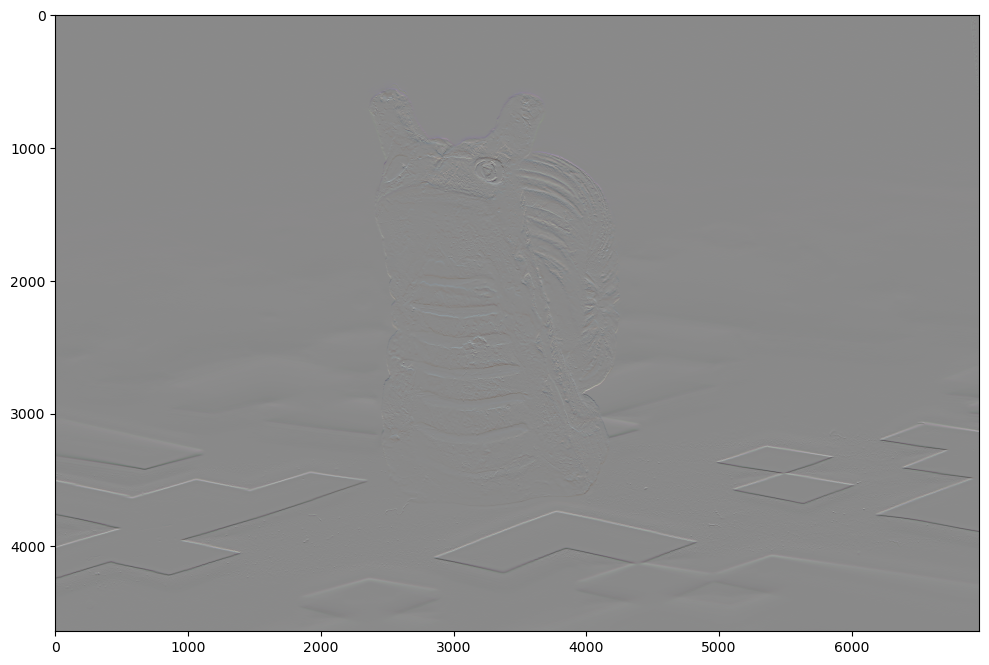

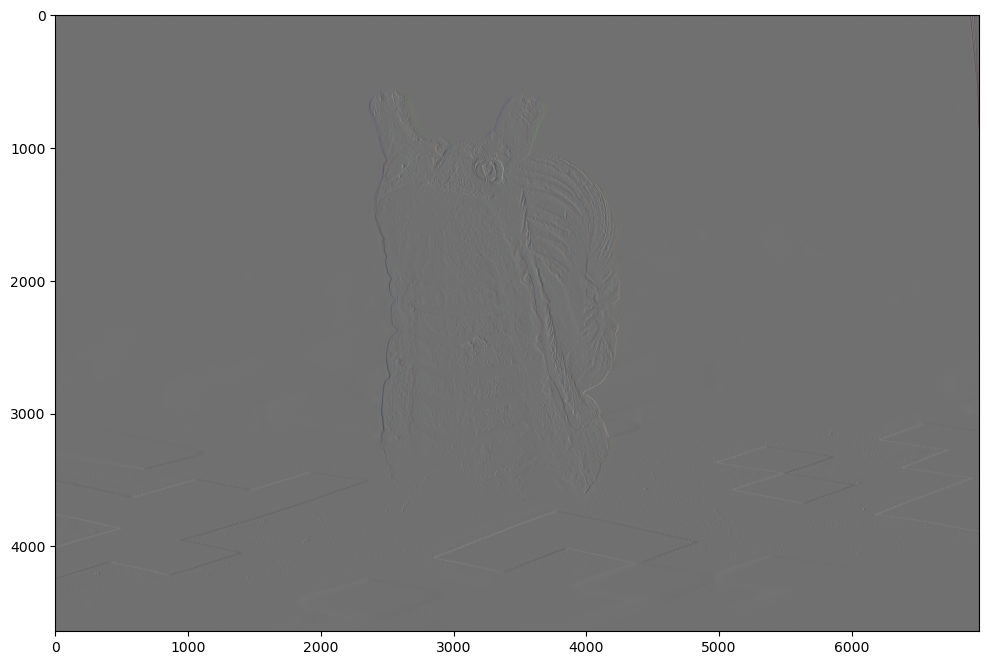

In [6]:
# y_sobel_scaled = (y_sobel - y_sobel.min()) / (y_sobel.max() - y_sobel.min())
plt.figure(figsize=(16,8))
plt.imshow(im_utils.normalize_im(y_sobel))
plt.show()

plt.figure(figsize=(16,8))
plt.imshow(im_utils.normalize_im(x_sobel))
plt.show()

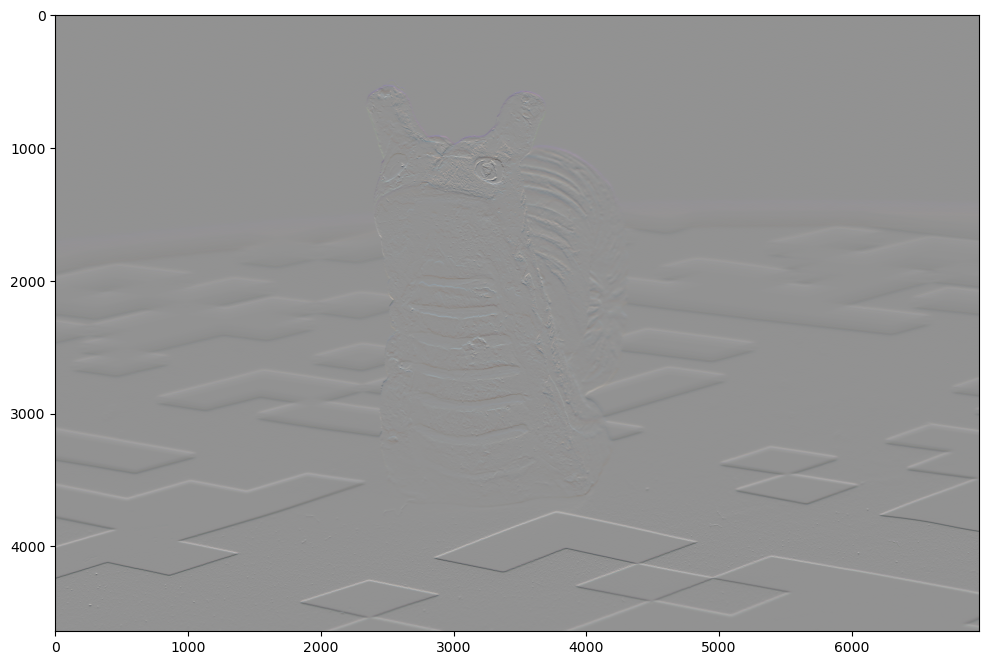

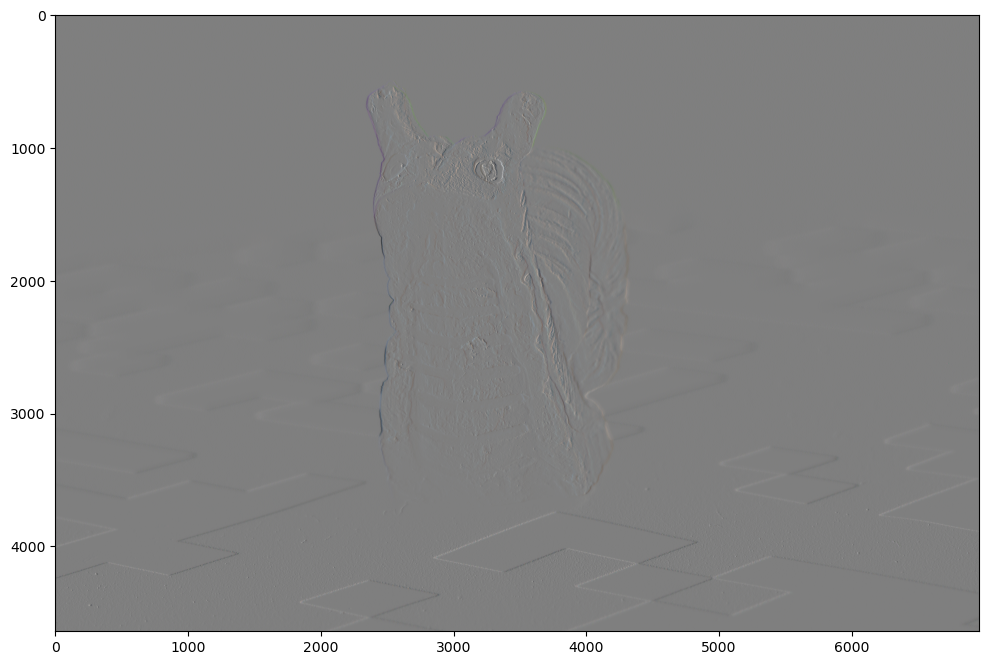

In [8]:
ksize = 5
y_sobel_orig = cv2.Sobel(orig, ddepth=cv2.CV_32F, dx=0, dy=1, ksize=ksize)
x_sobel_orig = cv2.Sobel(orig, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=ksize)
# y_sobel_scaled = (y_sobel - y_sobel.min()) / (y_sobel.max() - y_sobel.min())
plt.figure(figsize=(16,8))
plt.imshow(im_utils.normalize_im(y_sobel_orig))
plt.show()

plt.figure(figsize=(16,8))
plt.imshow(im_utils.normalize_im(x_sobel_orig))
plt.show()

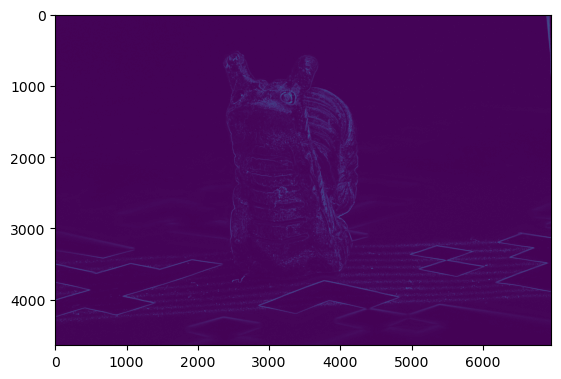

In [40]:
fused_sobel_mag = np.sqrt(x_sobel.max(axis=-1)**2 + y_sobel.max(axis=-1)**2)
plt.imshow(fused_sobel_mag)

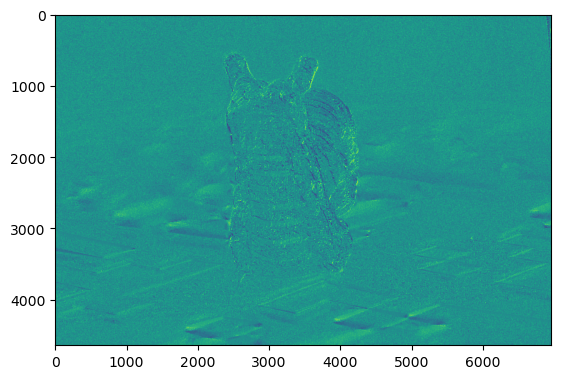

In [44]:
fused_sobel_ori = np.arctan(x_sobel.max(axis=-1)/(y_sobel.max(axis=-1)+1e-8))
plt.imshow(fused_sobel_ori)

In [45]:
y_sobel_0 = cv2.Sobel(registered_images[0], ddepth=cv2.CV_32F, dx=0, dy=1, ksize=ksize)
x_sobel_0 = cv2.Sobel(registered_images[0], ddepth=cv2.CV_32F, dx=1, dy=0, ksize=ksize)

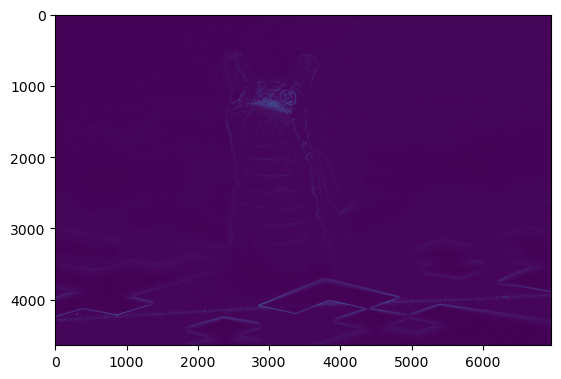

In [47]:
sobel_0_mag = np.sqrt(x_sobel_0.max(axis=-1)**2 + y_sobel_0.max(axis=-1)**2)
plt.imshow(sobel_0_mag)

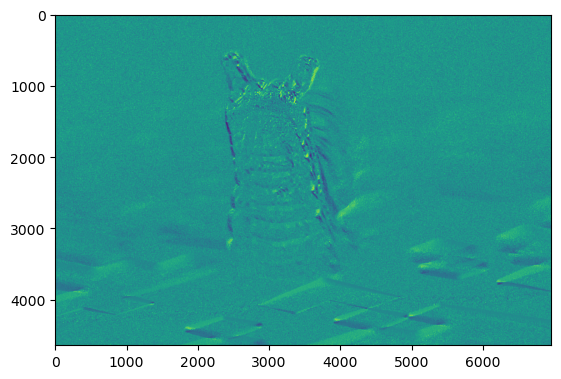

In [48]:
sobel_0_ori = np.arctan(x_sobel_0.max(axis=-1)/(y_sobel_0.max(axis=-1)+1e-8))
plt.imshow(sobel_0_ori)

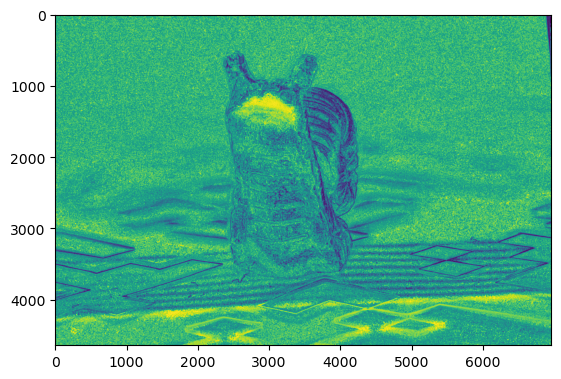

In [56]:
rel_mag_0 = np.where(fused_sobel_mag < sobel_0_mag, fused_sobel_mag/(sobel_0_mag+1e-9), sobel_0_mag/(fused_sobel_mag+1e-9))
plt.imshow(rel_mag_0)

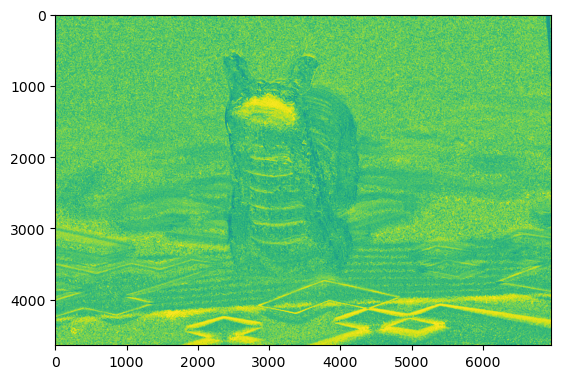

In [57]:
rel_ori_0 = 1 - np.abs(sobel_0_ori - fused_sobel_ori)/(np.pi/2)
plt.imshow(rel_ori_0)

In [63]:
s = 1 / (1 + np.e**(-1*rel_mag_0))

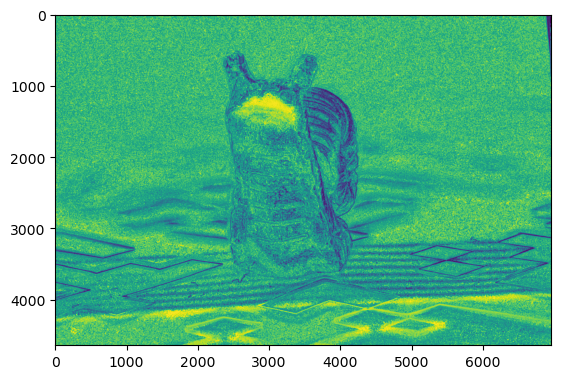

In [64]:
plt.imshow(s)

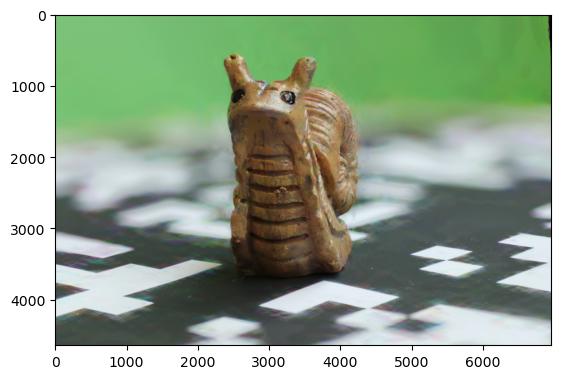

In [27]:
plt.imshow(im_utils.bgr_to_rgb(cv2.imread('/n/fs/3d-indoor/macro_data/focus_stacks/snail/000/f4.0/results/wavelet_mine.png')))